In [34]:
import pylab
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from collections import Counter
import matplotlib.pyplot as plt
from statistics import mean, median, mode, stdev


from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [35]:
Path_File = 'weatherAUS.csv'
DB = pd.read_csv(Path_File)

In [36]:
class Process_Data: 
    def __init__(self,DB):
        self.DB=DB
        
    def Digest_Dataframe(self):
        return self.DB.info()
    
    def Get_DB(self):
        return self.DB
    
    def Describe_DB(self):
        return self.DB.head()
    
    def Sum_Null_Value(self):
        return self.DB.isnull().sum()
    
    def Get_NullValues_Variable(self, Variable):
        return self.DB[Variable].isnull().sum()
    
    def Percentage_Null_Value(self):
        return ( self.DB.isnull().sum() / len(self.DB) ) * 100
    
    def GetVariables_Out_of_Percentage_Range(self, Percentage):
        Values = self.Percentage_Null_Value()
        return [Variables for Variables in Values.keys() if Values[Variables] >= Percentage]
    
    def GetVariables_In_Percentage_Range(self, Percentage):
        Values = self.Percentage_Null_Value()
        return [Variables for Variables in Values.keys() if Values[Variables] < Percentage]
    
    def Get_Variable_Type(self, Variable_Type):
        return [Variables for Variables in self.DB.keys() if self.DB[Variables].dtype == 'object'] if Variable_Type == "Categorical" else [Variables for Variables in self.DB.keys() if self.DB[Variables].dtype != 'object']
    
    def Remove_Variables(self, Variables):
        return self.DB.drop(Variables, axis = 1)
    
    def Convert_To_Variable_Date(self, Variable_Date):
        return pd.to_datetime(self.DB[Variable_Date])
    
    def Get_Year(self, Variable_Date):
        return self.Convert_To_Variable_Date(Variable_Date).dt.year
    
    def Get_Month(self, Variable_Date):
        return self.Convert_To_Variable_Date(Variable_Date).dt.month
    
    def Get_Day(self, Variable_Date):
        return self.Convert_To_Variable_Date(Variable_Date).dt.day
    
    def Add_Column_In_DataFrame(self, Variable, Values_To_Add):
        return self.DB.insert(0, Variable, Values_To_Add)
    
    def Get_Variable_Info(self, Variable):
        return self.DB[Variable]
    
    def Replace_Continuous_Values(self, Metodo):
        Type_Variable = self.Get_Variable_Type("Continuous")
        for Variables in Type_Variable:
            if(self.Get_NullValues_Variable(Variables) != 0):
                List_Of_Values = [Value for Value in self.Get_DB()[Variables] if pd.isnull(Value)==False]
                Value_Replace = Statistical_Processing(List_Of_Values).Get_Metodo(Metodo)
                self.Get_DB()[Variables] = [ Value if pd.isnull(Value)==False else Value_Replace for Value in self.Get_DB()[Variables] ]
        
    def Counter_Categorical_Values(self, Variable):
        List_Of_Values = [Value for Value in self.Get_DB()[Variable] if pd.isnull(Value)==False]
        return list(Counter(List_Of_Values))
    
    def Replace_Categorical_Values(self):
        Type_Variable = self.Get_Variable_Type("Categorical")
        for Variable in Type_Variable:
            List_Of_Value = self.Counter_Categorical_Values(Variable)
            self.Get_DB()[Variable] = [List_Of_Value.index(Index) if Index in List_Of_Value else Index for Index in self.Get_DB()[Variable]]
    
    def Delete_Rows_With_Null_Value(self):
        return self.DB.dropna()

In [37]:
class Statistical_Processing:
    def __init__(self,Variable_Values):
        self.Variable_Values=Variable_Values
    
    def Media(self):
        return mean(self.Variable_Values)
    
    def Mediana(self):
        return median(self.Variable_Values)
    
    def Moda(self):
        return mode(self.Variable_Values)
    
    def Desviacion(self):
        return stdev(self.Variable_Values)
    
    def Maximo(self):
        return max(self.Variable_Values)
    
    def Minimo(self):
        return min(self.Variable_Values)
    
    def Get_Metodo(self, Metodo):
        if(Metodo=="Media"):
            Value = self.Media()
        elif(Metodo=="Mediana"):
            Value = self.Mediana()
        elif(Metodo=="Moda"):
            Value = self.Moda()
        else:
            Value = 0
        return Value
    
    def Normality_Test_Plot(self):
        stats.probplot(self.Variable_Values, dist="norm", plot=pylab)
        pylab.show()
    
    def Histogram_Plot(self, Title):
        df = pd.DataFrame({Title: self.Variable_Values})
        df.hist(bins="auto", color='#ff9500')

In [38]:
class Analytical_Processing:
    def __init__(self,DB):
        self.DB=DB
        
    def Correlation_Matrix(self, Metodo):
        return self.DB.corr(method=Metodo)
        
    def Plot_Correlation_Matrix(self, Metodo):
        plt.matshow(self.DB.corr(method=Metodo))
    
    def Pairplot(self, Variable):
        sns.set(style="ticks", color_codes=True)
        g = sns.pairplot(self.DB, hue=Variable)
        plt.show()

In [39]:
Data = Process_Data(DB)

In [40]:
Data.Digest_Dataframe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [41]:
Data.Percentage_Null_Value()

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [42]:
Variables_Out_Range = Data.GetVariables_Out_of_Percentage_Range(15)

In [43]:
Variables_Out_Range

['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm']

In [44]:
DB = Data.Remove_Variables(Variables_Out_Range)
Data = Process_Data(DB)
Data.Digest_Dataframe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   WindGustDir    135134 non-null  object 
 6   WindGustSpeed  135197 non-null  float64
 7   WindDir9am     134894 non-null  object 
 8   WindDir3pm     141232 non-null  object 
 9   WindSpeed9am   143693 non-null  float64
 10  WindSpeed3pm   142398 non-null  float64
 11  Humidity9am    142806 non-null  float64
 12  Humidity3pm    140953 non-null  float64
 13  Pressure9am    130395 non-null  float64
 14  Pressure3pm    130432 non-null  float64
 15  Temp9am        143693 non-null  float64
 16  Temp3pm        141851 non-null  float64
 17  RainToday      142199 non-nul

In [45]:
Data.Get_Variable_Info("Date")

0         2008-12-01
1         2008-12-02
2         2008-12-03
3         2008-12-04
4         2008-12-05
             ...    
145455    2017-06-21
145456    2017-06-22
145457    2017-06-23
145458    2017-06-24
145459    2017-06-25
Name: Date, Length: 145460, dtype: object

In [46]:
Year = Data.Get_Year("Date")
Month = Data.Get_Month("Date")
Day = Data.Get_Day("Date")

In [47]:
Data.Add_Column_In_DataFrame("Year", Year)
Data.Add_Column_In_DataFrame("Month", Month)
Data.Add_Column_In_DataFrame("Day", Day)

In [48]:
DB = Data.Remove_Variables("Date")
Data = Process_Data(DB)
Data.Digest_Dataframe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Day            145460 non-null  int64  
 1   Month          145460 non-null  int64  
 2   Year           145460 non-null  int64  
 3   Location       145460 non-null  object 
 4   MinTemp        143975 non-null  float64
 5   MaxTemp        144199 non-null  float64
 6   Rainfall       142199 non-null  float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Temp9am        143693 non-nul

In [49]:
Continuous = Data.Get_Variable_Type("Continuous")

In [50]:
Continuous

['Day',
 'Month',
 'Year',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm']

In [51]:
Data.Replace_Continuous_Values("Media")

In [52]:
Data.Percentage_Null_Value()

Day              0.000000
Month            0.000000
Year             0.000000
Location         0.000000
MinTemp          0.000000
MaxTemp          0.000000
Rainfall         0.000000
WindGustDir      7.098859
WindGustSpeed    0.000000
WindDir9am       7.263853
WindDir3pm       2.906641
WindSpeed9am     0.000000
WindSpeed3pm     0.000000
Humidity9am      0.000000
Humidity3pm      0.000000
Pressure9am      0.000000
Pressure3pm      0.000000
Temp9am          0.000000
Temp3pm          0.000000
RainToday        2.241853
RainTomorrow     2.245978
dtype: float64

In [53]:
Data.Replace_Categorical_Values()

In [54]:
Data.Digest_Dataframe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Day            145460 non-null  int64  
 1   Month          145460 non-null  int64  
 2   Year           145460 non-null  int64  
 3   Location       145460 non-null  int64  
 4   MinTemp        145460 non-null  float64
 5   MaxTemp        145460 non-null  float64
 6   Rainfall       145460 non-null  float64
 7   WindGustDir    135134 non-null  float64
 8   WindGustSpeed  145460 non-null  float64
 9   WindDir9am     134894 non-null  float64
 10  WindDir3pm     141232 non-null  float64
 11  WindSpeed9am   145460 non-null  float64
 12  WindSpeed3pm   145460 non-null  float64
 13  Humidity9am    145460 non-null  float64
 14  Humidity3pm    145460 non-null  float64
 15  Pressure9am    145460 non-null  float64
 16  Pressure3pm    145460 non-null  float64
 17  Temp9am        145460 non-nul

In [55]:
Data.Describe_DB()

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,0,13.4,22.9,0.6,0.0,44.0,0.0,...,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,0.0,0.0
1,2,12,2008,0,7.4,25.1,0.0,1.0,44.0,1.0,...,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,0.0,0.0
2,3,12,2008,0,12.9,25.7,0.0,2.0,46.0,0.0,...,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,0.0,0.0
3,4,12,2008,0,9.2,28.0,0.0,3.0,24.0,2.0,...,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,0.0,0.0
4,5,12,2008,0,17.5,32.3,1.0,0.0,41.0,3.0,...,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,0.0,0.0


In [56]:
DB = Data.Delete_Rows_With_Null_Value()

In [57]:
Data = Process_Data(DB)
Data.Digest_Dataframe()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 123710 entries, 0 to 145458
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Day            123710 non-null  int64  
 1   Month          123710 non-null  int64  
 2   Year           123710 non-null  int64  
 3   Location       123710 non-null  int64  
 4   MinTemp        123710 non-null  float64
 5   MaxTemp        123710 non-null  float64
 6   Rainfall       123710 non-null  float64
 7   WindGustDir    123710 non-null  float64
 8   WindGustSpeed  123710 non-null  float64
 9   WindDir9am     123710 non-null  float64
 10  WindDir3pm     123710 non-null  float64
 11  WindSpeed9am   123710 non-null  float64
 12  WindSpeed3pm   123710 non-null  float64
 13  Humidity9am    123710 non-null  float64
 14  Humidity3pm    123710 non-null  float64
 15  Pressure9am    123710 non-null  float64
 16  Pressure3pm    123710 non-null  float64
 17  Temp9am        123710 non-nul

In [58]:
Data.Describe_DB()

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,12,2008,0,13.4,22.9,0.6,0.0,44.0,0.0,...,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,0.0,0.0
1,2,12,2008,0,7.4,25.1,0.0,1.0,44.0,1.0,...,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,0.0,0.0
2,3,12,2008,0,12.9,25.7,0.0,2.0,46.0,0.0,...,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,0.0,0.0
3,4,12,2008,0,9.2,28.0,0.0,3.0,24.0,2.0,...,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,0.0,0.0
4,5,12,2008,0,17.5,32.3,1.0,0.0,41.0,3.0,...,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,0.0,0.0


In [59]:
Data.Percentage_Null_Value()

Day              0.0
Month            0.0
Year             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

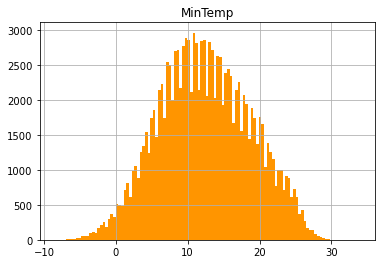

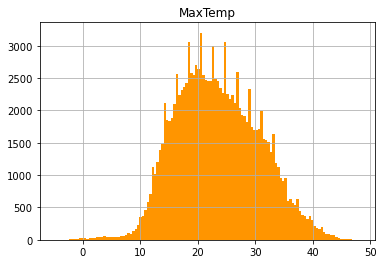

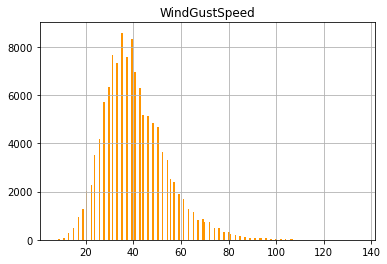

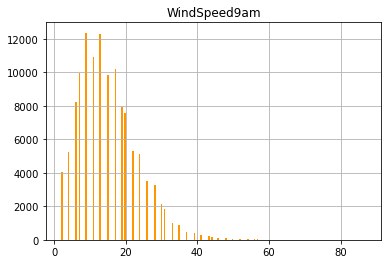

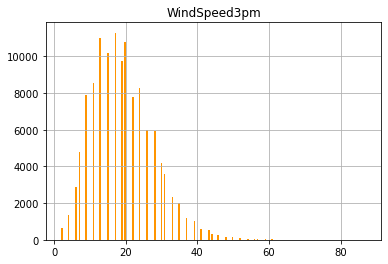

...

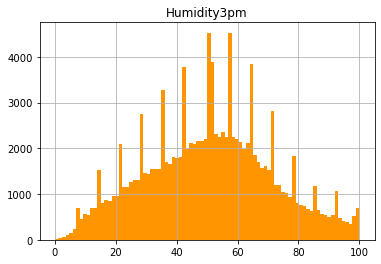

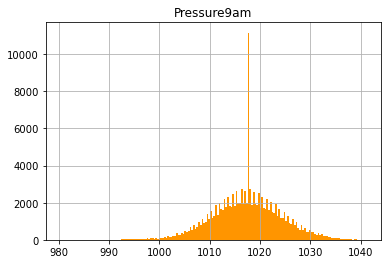

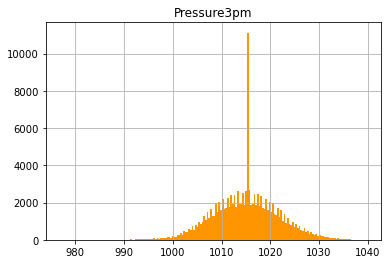

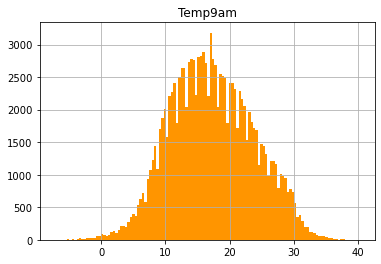

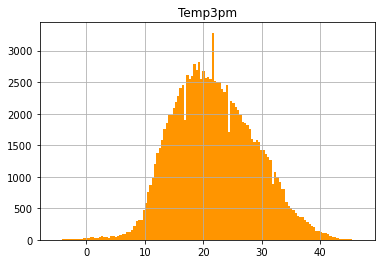

In [60]:
List_Of_Variables = ["MinTemp", "MaxTemp", "WindGustSpeed", "WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure9am", "Pressure3pm", "Temp9am", "Temp3pm"]

for Value in List_Of_Variables:
    Graff_Statistical = Statistical_Processing(DB[Value])
    Graff_Statistical.Histogram_Plot(Value)

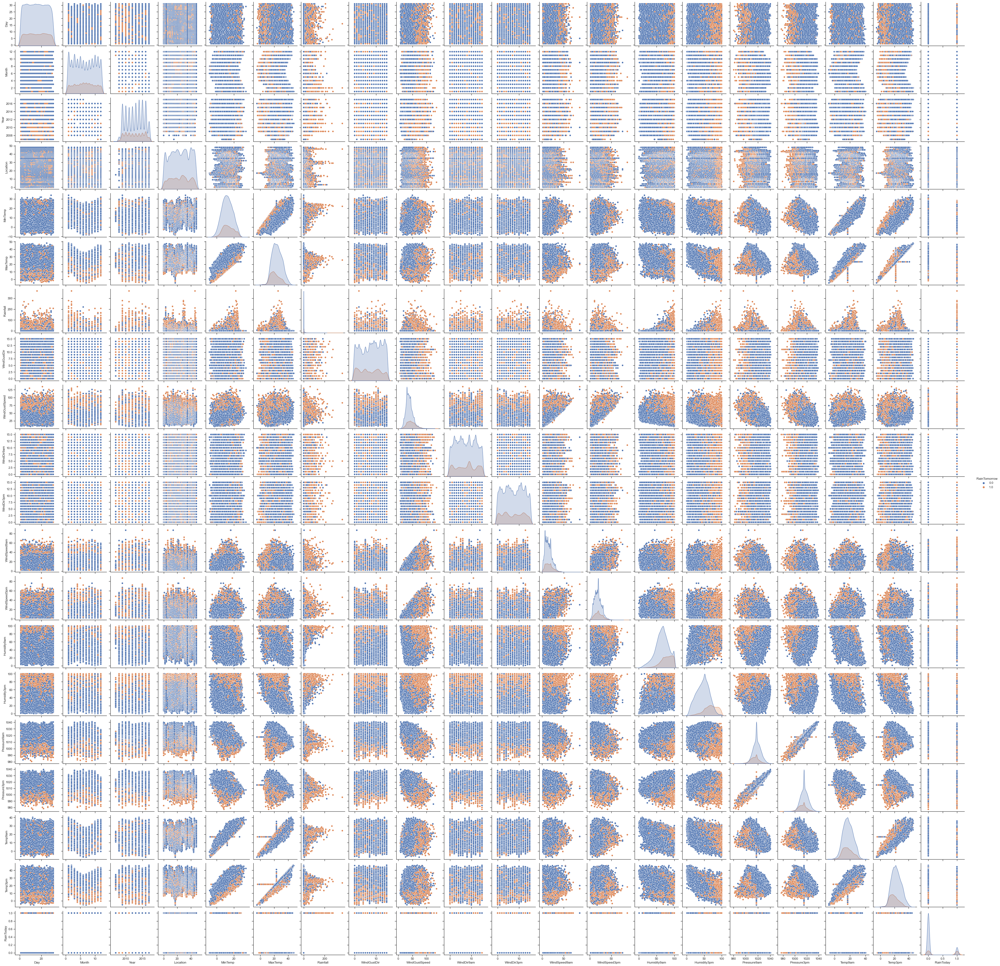

In [61]:
DB = Data.Get_DB()
Graff = Analytical_Processing(DB)
Graff.Pairplot("RainTomorrow")

In [62]:
Graff.Correlation_Matrix("spearman")

,Day,Month,Year,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Day,1.000000,0.014882,-0.005211,0.000962,-0.000525,-0.003015,0.004922,-0.013077,-0.010779,0.007633,...,-0.006760,-0.009839,0.017307,0.014740,-0.017329,-0.017332,-0.002849,-0.003814,0.004054,0.005312
Month,0.014882,1.000000,-0.113223,0.002240,-0.215243,-0.167673,0.012540,-0.086459,0.046601,0.015773,...,0.041132,0.054050,-0.084444,-0.013405,0.046788,0.033374,-0.148795,-0.178248,0.008020,0.006008
Year,-0.005211,-0.113223,1.000000,0.014012,0.037933,0.053043,-0.016281,0.016647,-0.033495,0.001960,...,-0.027819,-0.045408,0.015459,-0.002893,0.026888,0.022328,0.037840,0.042836,-0.012065,-0.013034
Location,0.000962,0.002240,0.014012,1.000000,0.054533,0.117134,-0.031595,0.077270,0.051324,-0.012855,...,0.061415,0.037997,-0.127195,-0.095896,-0.108597,-0.119315,0.101543,0.100719,-0.020213,-0.014918
MinTemp,-0.000525,-0.215243,0.037933,0.054533,1.000000,0.740248,0.010484,0.140288,0.164070,-0.019979,...,0.143776,0.158071,-0.201553,0.021943,-0.433012,-0.441302,0.894111,0.708676,0.038293,0.069044
MaxTemp,-0.003015,-0.167673,0.053043,0.117134,0.740248,1.000000,-0.308639,0.129260,0.058387,0.029362,...,-0.008846,0.036621,-0.465957,-0.464451,-0.326603,-0.417162,0.893385,0.978229,-0.241177,-0.167734
Rainfall,0.004922,0.012540,-0.016281,-0.031595,0.010484,-0.308639,1.000000,-0.042790,0.130375,-0.048647,...,0.084290,0.078104,0.462967,0.448159,-0.147919,-0.059401,-0.169977,-0.313939,0.843463,0.336261
WindGustDir,-0.013077,-0.086459,0.016647,0.077270,0.140288,0.129260,-0.042790,1.000000,-0.077014,-0.051967,...,0.013308,-0.064841,-0.039824,-0.017087,0.133534,0.129770,0.136156,0.131927,-0.035981,-0.062205
WindGustSpeed,-0.010779,0.046601,-0.033495,0.051324,0.164070,0.058387,0.130375,-0.077014,1.000000,0.009071,...,0.569453,0.668031,-0.188936,-0.031760,-0.390044,-0.345701,0.130672,0.024752,0.144019,0.214765
WindDir9am,0.007633,0.015773,0.001960,-0.012855,-0.019979,0.029362,-0.048647,-0.051967,0.009071,1.000000,...,-0.016069,-0.005776,-0.019041,-0.035004,-0.013281,-0.040467,0.011572,0.028205,-0.042075,0.014322


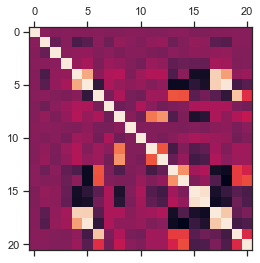

In [63]:
Graff.Plot_Correlation_Matrix("spearman")

Considerando el análisis previo y tomando como Variable Objetivo la Columna RainTomorrow se define las siguientes características que se usaran para el modelo. 
"Day"
"Month"
"Location"
"MinTemp"
"MaxTemp"
"Rainfall"
"WindGustDir"
"WindGustSpeed"
"WindDir9am"
"WindDir3pm"
"WindSpeed9am"
"WindSpeed3pm"
"Humidity9am"
"Humidity3pm"
"Pressure9am"
"RainToday"

Esto debido a que, al principio del análisis se encontró que las Variables 
['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm']

Tenían una gran cantidad de valores perdidos y las Variables 

['Temp3pm', 'Temp9am', 'Pressure3pm']

Están fuertemente correlacionadas, de acuerdo a nuestro análisis en la matriz de correlación. 

En este contexto, se propondrán 2 Modelos para Predecir si el día de mañana lloverá considerando cualquier Localidad que el Dataset Proporciono. Además, se medirá el nivel de eficacia del Modelo, utilizando la Matriz de confusión y la Puntuación total de la predicción. 

Los dos Modelos de predicción que se usaran son: 

	Árbol de decisión
    
	Regresión Logística

In [73]:
Lista = ["Year", "RainTomorrow", "Temp3pm", "Temp9am", "Pressure3pm"]

X = DB.drop(Lista, axis=1)
y = DB['RainTomorrow']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print("Puntuación de precisión", accuracy_score(y_test, y_pred))

[[16473  2803]
 [ 2547  2919]]
              precision    recall  f1-score   support

         0.0       0.87      0.85      0.86     19276
         1.0       0.51      0.53      0.52      5466

    accuracy                           0.78     24742
   macro avg       0.69      0.69      0.69     24742
weighted avg       0.79      0.78      0.79     24742

Puntuación de precisión 0.7837684908253173


In [74]:
Lista = ["Year", "RainTomorrow", "Temp3pm", "Temp9am", "Pressure3pm"]

X = DB.drop(Lista, axis=1)
y = DB['RainTomorrow']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

classifier = LogisticRegression()
classifier.fit(X_train, y_train)

y_pred = classifier.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

print("Puntuación de precisión", accuracy_score(y_test, y_pred))

[[18341   960]
 [ 2945  2496]]
              precision    recall  f1-score   support

         0.0       0.86      0.95      0.90     19301
         1.0       0.72      0.46      0.56      5441

    accuracy                           0.84     24742
   macro avg       0.79      0.70      0.73     24742
weighted avg       0.83      0.84      0.83     24742

Puntuación de precisión 0.8421712068547409


Se puede observar que el Modelo de Regresión Logística tiene un Mayor Porcentaje de Predicción. En ambos casos se utiliza 80 % del Set de Datos para Entrenar y el restante para Validar. 

En términos generales, se podría implementar el Modelo de Regresión Logística, teniendo métricas de seguimiento y de Validación del Modelo con el paso del Tiempo. 

Además, se puede proponer entrenar de nueva cuenta el modelo con mas datos en un futuro y aplicar Métodos de Validación del Modelo como la Validación Cruzada. Lo cual nos permitirá saber con mayor exactitud del rendimiento de nuestro modelo. 